In [1]:
from binance.client import Client
import websocket
import datetime
import json
import uuid
import sqlite3
import time
import timeit
import pandas as pd
import numpy as np
import database as db
import ast
import sys
from functools import reduce
import warnings 
import config
import matplotlib.pyplot as plt
warnings.simplefilter("ignore")
import itertools
from tqdm import tnrange, notebook
from datetime import timedelta, datetime

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px

In [2]:
# Drawing data from database and binance

def get_latest_symbol_list_db(raw_data_schema = 'cmc_raw_data'):
    table_list = db.get_all_table_list(raw_data_schema)
    table_list = [eval(i) for i in table_list]
    table_list.sort()
    # Get latest date
    date = table_list[-1]
    
    # Draw the data for the latest date
    df = db.get_db_data(raw_data_schema, str(date))
    final_list = list(df['Symbol'])
    return final_list

def get_historical_price(symbol, start_date):
    client = Client(config.binance_api_key_usdm_read, config.binance_secret_key_usdm_read)
    # SET TIME INTERVAL OF CLOSE PRICES
    interval = Client.KLINE_INTERVAL_1HOUR
#     interval = Client.KLINE_INTERVAL_15MINUTE 
    klines = client.get_historical_klines(symbol, interval, start_date)
    df = pd.DataFrame(klines, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_asset_volume', 'number_of_trades', 'taker_buy_base_asset_volume', 'taker_buy_quote_asset_volume', 'ignore'])
    df = df[['timestamp', 'open', 'high', 'low', 'close', 'volume']]
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
    df.set_index('timestamp', inplace=True)
    df['close'] = pd.to_numeric(df['close'])
    df = df.dropna()
    
    return df

def get_final_price_series(symbol_list, start_date):
    final_list = []
    
    # Use BTCUSDT as benchmark to store see what the length of the timeseries should be
    df_btc = get_historical_price('BTCUSDT', start_date)
    benchmark_length = len(df_btc)
    print(benchmark_length)
    for symbol in symbol_list:
        print(symbol)
        try:
            df = get_historical_price(symbol+'USDT', start_date)
            time.sleep(5)
            if len(df) != benchmark_length:
                pass
            else:
                df_close = df[['close', 'volume']]
                df_close.rename(columns = {'close':f'{symbol}_close', 'volume':f'{symbol}_volume'}, inplace=True)
                final_list.append(df_close)
        except Exception as e:
            print(e)
    return final_list

In [3]:
def get_final_price_df(start_date):
    untradeable_instrument = ['BTC', 'ETH', 'BNB', '1000LUNC', 'XRP', 'LTC', 'ETC',
                              'WAVES', 'ANKR','SAND','REN','ZIL', 'SUSHI', 'ALPHA',
                              'YFI']
    symbol_list = get_latest_symbol_list_db()
    tradeable_instrument = [instru for instru in symbol_list if instru not in untradeable_instrument]
    print(tradeable_instrument)
    final_symbol_list = get_final_price_series(tradeable_instrument, start_date)
    df_final_time_series = pd.concat(final_symbol_list,axis=1)
    
    return df_final_time_series

def get_final_price_df(start_date):
    tradeable_instrument = ['ADA', 'DOGE', 'SOL', 'TRX', 'MATIC', 'DOT', 'TON', 'BCH', 'AVAX', 'SHIB', 'LINK', 'XLM', 'LEO', 'UNI', 'XMR', 'OKB', 'FIL', 'ICP', 'LDO', 'HBAR', 'APT', 'ARB', 'CRO', 'NEAR', 'QNT', 'OP', 'GRT', 'MKR', 'BIT', 'AAVE', 'ALGO', 'STX', 'EGLD', 'EOS', 'IMX']
    print(tradeable_instrument)
    final_symbol_list = get_final_price_series(tradeable_instrument, start_date)
    df_final_time_series = pd.concat(final_symbol_list,axis=1)
    
    return df_final_time_series

In [4]:
start_date = "1 Jan, 2021"

df_final_time_series = get_final_price_df(start_date)

df_final_time_series

['ADA', 'DOGE', 'SOL', 'TRX', 'MATIC', 'DOT', 'TON', 'BCH', 'AVAX', 'SHIB', 'LINK', 'XLM', 'LEO', 'UNI', 'XMR', 'OKB', 'FIL', 'ICP', 'LDO', 'HBAR', 'APT', 'ARB', 'CRO', 'NEAR', 'QNT', 'OP', 'GRT', 'MKR', 'BIT', 'AAVE', 'ALGO', 'STX', 'EGLD', 'EOS', 'IMX']
22506
ADA
DOGE
SOL
TRX
MATIC
DOT
TON
APIError(code=-1121): Invalid symbol.
BCH
AVAX
SHIB
LINK
XLM
LEO
APIError(code=-1121): Invalid symbol.
UNI
XMR
OKB
APIError(code=-1121): Invalid symbol.
FIL
ICP
LDO
HBAR
APT
ARB
CRO
APIError(code=-1121): Invalid symbol.
NEAR
QNT
OP
GRT
MKR
BIT
APIError(code=-1121): Invalid symbol.
AAVE
ALGO
STX
EGLD
EOS
IMX


,ADA_close,ADA_volume,DOGE_close,DOGE_volume,SOL_close,SOL_volume,TRX_close,TRX_volume,MATIC_close,MATIC_volume,...,AAVE_close,AAVE_volume,ALGO_close,ALGO_volume,STX_close,STX_volume,EGLD_close,EGLD_volume,EOS_close,EOS_volume
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,0.18051,19194919.10000000,0.004679,27682073.00000000,1.5442,56894.22000000,0.02680,19264392.60000000,0.01782,3886000.30000000,...,88.097,15866.76500000,0.3460,2610020.56000000,0.4016,149212.34000000,24.880,14748.99500000,2.6025,446540.68000000
2021-01-01 01:00:00,0.18358,28601648.40000000,0.004737,45350221.00000000,1.5734,256745.01000000,0.02719,52786608.90000000,0.01802,7044376.90000000,...,87.422,11247.79700000,0.3447,3293273.01000000,0.4062,456950.24000000,24.814,14020.22400000,2.6319,546405.18000000
2021-01-01 02:00:00,0.18368,20075571.10000000,0.004755,17278135.00000000,1.5872,53278.27000000,0.02728,29000642.40000000,0.01794,10982031.20000000,...,87.882,7814.50500000,0.3542,2366304.84000000,0.4054,155540.52000000,24.839,4498.36300000,2.6310,380641.80000000
2021-01-01 03:00:00,0.18292,15704497.10000000,0.004978,165646699.00000000,1.6029,36968.00000000,0.02716,23179382.90000000,0.01815,5222857.00000000,...,88.454,9303.14100000,0.3591,3076161.02000000,0.4155,258578.23000000,24.798,2375.42500000,2.6353,415831.43000000
2021-01-01 04:00:00,0.18180,16338316.20000000,0.004894,147434756.00000000,1.6022,46602.17000000,0.02705,36028509.30000000,0.01809,2159474.80000000,...,87.431,10928.14800000,0.3525,1712698.79000000,0.4172,120266.66000000,24.824,5629.97400000,2.6386,599350.29000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-28 03:00:00,0.30840,2016392.40000000,0.077510,31378433.00000000,24.9400,113396.39000000,0.08318,4627315.40000000,0.71740,726825.00000000,...,72.840,1631.86600000,0.1092,8092894.00000000,0.5987,149573.10000000,32.570,838.67000000,0.7440,156283.10000000
2023-07-28 04:00:00,0.30890,940967.70000000,0.077390,29785222.00000000,25.0200,55906.21000000,0.08338,8674555.80000000,0.71500,1119759.90000000,...,72.890,1403.48300000,0.1094,1789164.00000000,0.5975,131387.50000000,32.590,818.23000000,0.7450,149681.40000000
2023-07-28 05:00:00,0.30700,2063013.50000000,0.076380,64455540.00000000,24.6800,160736.09000000,0.08368,18000483.10000000,0.70730,5026066.90000000,...,72.510,2391.78600000,0.1084,2385150.00000000,0.5937,281109.60000000,32.360,1671.28000000,0.7420,1134597.90000000


## 12 month look back

In [5]:
# look back period

current_time = pd.to_datetime('now')

window = 12  # Number of units
unit = 'months'  # Time unit ('hours', 'days', 'months', 'years')

start_time = current_time - pd.DateOffset(**{unit: window})
selected_rows = df_final_time_series.loc[start_time:current_time]
selected_rows

,ADA_close,ADA_volume,DOGE_close,DOGE_volume,SOL_close,SOL_volume,TRX_close,TRX_volume,MATIC_close,MATIC_volume,...,AAVE_close,AAVE_volume,ALGO_close,ALGO_volume,STX_close,STX_volume,EGLD_close,EGLD_volume,EOS_close,EOS_volume
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-07-28 08:00:00,0.5031,8439743.70000000,0.06671,25403983.00000000,39.59,110635.39000000,0.06836,12894526.10000000,0.8752,5953146.70000000,...,92.30,6316.77700000,0.3256,864728.00000000,0.4140,107823.50000000,54.55,5581.77000000,1.292,1718227.80000000
2022-07-28 09:00:00,0.4988,11025151.10000000,0.06647,44584125.00000000,39.53,136290.40000000,0.06856,23718964.30000000,0.8725,5822231.40000000,...,91.70,4853.01000000,0.3254,737864.00000000,0.4180,168288.90000000,54.60,6776.53000000,1.271,1365759.20000000
2022-07-28 10:00:00,0.4994,5962471.10000000,0.06651,21471846.00000000,39.86,231490.22000000,0.06873,20707611.90000000,0.8770,4426792.40000000,...,92.10,6959.33900000,0.3268,970650.00000000,0.4210,121532.80000000,54.77,5284.43000000,1.270,746728.10000000
2022-07-28 11:00:00,0.5024,6731669.30000000,0.06687,20347140.00000000,40.53,319410.88000000,0.06896,19092974.60000000,0.8948,6878447.90000000,...,93.10,6787.38400000,0.3285,1566976.00000000,0.4190,78855.30000000,55.03,6895.61000000,1.271,693758.50000000
2022-07-28 12:00:00,0.4988,25452824.50000000,0.06619,75458928.00000000,39.99,715787.12000000,0.06804,53093643.70000000,0.8730,20718189.50000000,...,92.00,34327.42200000,0.3249,3683184.00000000,0.4170,225934.60000000,54.05,27355.88000000,1.253,2062334.10000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-28 03:00:00,0.3084,2016392.40000000,0.07751,31378433.00000000,24.94,113396.39000000,0.08318,4627315.40000000,0.7174,726825.00000000,...,72.84,1631.86600000,0.1092,8092894.00000000,0.5987,149573.10000000,32.57,838.67000000,0.744,156283.10000000
2023-07-28 04:00:00,0.3089,940967.70000000,0.07739,29785222.00000000,25.02,55906.21000000,0.08338,8674555.80000000,0.7150,1119759.90000000,...,72.89,1403.48300000,0.1094,1789164.00000000,0.5975,131387.50000000,32.59,818.23000000,0.745,149681.40000000
2023-07-28 05:00:00,0.3070,2063013.50000000,0.07638,64455540.00000000,24.68,160736.09000000,0.08368,18000483.10000000,0.7073,5026066.90000000,...,72.51,2391.78600000,0.1084,2385150.00000000,0.5937,281109.60000000,32.36,1671.28000000,0.742,1134597.90000000


In [6]:
# read from local csv file
top_pairs = pd.read_csv('top_pairs.csv')
top_pairs

,scores,pvalues,pairs
0,-6.113861,9.184746e-07,"('LINK', 'XLM')"
1,-5.750610,5.493387e-06,"('XLM', 'AAVE')"
2,-5.617019,1.037475e-05,"('MKR', 'EOS')"
3,-5.571333,1.285769e-05,"('BCH', 'MKR')"
4,-5.273099,5.024097e-05,"('AAVE', 'EOS')"
...,...,...,...
226,-1.472408,7.716195e-01,"('SOL', 'GRT')"
227,-1.467844,7.733148e-01,"('ADA', 'AVAX')"
228,-1.445338,7.815506e-01,"('SOL', 'UNI')"
229,-1.422069,7.898485e-01,"('SOL', 'AAVE')"


In [7]:
def convert_string_to_intervals(input_string):
    # Extract the numerical part of the string
    number_of_days = int(input_string[:-1])

    # Calculate the number of minutes in the given number of days
    minutes_in_a_day = 24 * 60
    total_minutes = number_of_days * minutes_in_a_day

    # Calculate the number of 15-minute intervals
    interval_length = 15
    number_of_intervals = total_minutes // interval_length

    return number_of_intervals

def sma(data, window):
    sma = data.rolling(window = window).mean()
    return sma

def ewma(data, window):
    num_rows = convert_string_to_intervals(window)
    ewma = data.ewm(span=num_rows, adjust=False).mean()
    return ewma


def bb(data, ma, no_sds, window):
    std = data.rolling(window = window).std()
    upper_bb = ma + std * no_sds
    lower_bb = ma - std * no_sds
    return upper_bb, lower_bb


In [86]:
P1 = 'LINK'
P2 = 'XLM'

price1 = selected_rows[P1+'_close']
price2 = selected_rows[P2+'_close']

selected_rows_pair = selected_rows[[P1+'_close', P2+'_close']]

ratios = price1/price2


bol_df = pd.DataFrame()

bol_df['ewma'] = ewma(ratios, '1D')
bol_df['upper_bb'], bol_df['lower_bb'] = bb(ratios, bol_df['ewma'], 2, '1D')
bol_df['upper_bb_conf'], bol_df['lower_bb_conf'] = bb(ratios, bol_df['ewma'], 3, '1D')
bol_df['upper_bb_stop'], bol_df['lower_bb_stop'] = bb(ratios, bol_df['ewma'], 4, '1D')

bol_df = bol_df.dropna()
bol_df

,ewma,upper_bb,lower_bb,upper_bb_conf,lower_bb_conf,upper_bb_stop,lower_bb_stop
timestamp,,,,,,,
2022-07-28 09:00:00,61.157179,61.172825,61.141532,61.180648,61.133709,61.188472,61.125886
2022-07-28 10:00:00,61.155227,61.271205,61.039248,61.329195,60.981258,61.387184,60.923269
2022-07-28 11:00:00,61.152630,61.290260,61.014999,61.359076,60.946184,61.427891,60.877369
2022-07-28 12:00:00,61.150665,61.277005,61.024326,61.340175,60.961156,61.403345,60.897986
2022-07-28 13:00:00,61.140464,61.516245,60.764683,61.704135,60.576792,61.892025,60.388902
...,...,...,...,...,...,...,...
2023-07-28 03:00:00,50.823878,52.020366,49.627391,52.618609,49.029147,53.216853,48.430903
2023-07-28 04:00:00,50.793876,51.912674,49.675077,52.472074,49.115677,53.031473,48.556278
2023-07-28 05:00:00,50.764515,51.885623,49.643406,52.446178,49.082852,53.006732,48.522298


In [87]:
merged_df = pd.merge(selected_rows_pair, bol_df, left_index=True, right_index=True)

merged_df

,LINK_close,XLM_close,ewma,upper_bb,lower_bb,upper_bb_conf,lower_bb_conf,upper_bb_stop,lower_bb_stop
timestamp,,,,,,,,,
2022-07-28 09:00:00,6.808,0.1113,61.157179,61.172825,61.141532,61.180648,61.133709,61.188472,61.125886
2022-07-28 10:00:00,6.839,0.1120,61.155227,61.271205,61.039248,61.329195,60.981258,61.387184,60.923269
2022-07-28 11:00:00,6.878,0.1127,61.152630,61.290260,61.014999,61.359076,60.946184,61.427891,60.877369
2022-07-28 12:00:00,6.814,0.1116,61.150665,61.277005,61.024326,61.340175,60.961156,61.403345,60.897986
2022-07-28 13:00:00,6.751,0.1113,61.140464,61.516245,60.764683,61.704135,60.576792,61.892025,60.388902
...,...,...,...,...,...,...,...,...,...
2023-07-28 03:00:00,7.928,0.1610,50.823878,52.020366,49.627391,52.618609,49.029147,53.216853,48.430903
2023-07-28 04:00:00,7.899,0.1600,50.793876,51.912674,49.675077,52.472074,49.115677,53.031473,48.556278
2023-07-28 05:00:00,7.835,0.1587,50.764515,51.885623,49.643406,52.446178,49.082852,53.006732,48.522298


In [16]:
# Trade using a simple strategy WITH INVENTORY
def trade(P1, P2, merged_df):
    
    price1 = merged_df[P1+'_close']
    price2 = merged_df[P2+'_close']
    
    ratios = price1/price2
    
    # Start with no money and no positions
    money = 0
    countS1 = 0
    countS2 = 0
    drawdown = 0
    
    # Logging all transactions for validation
    transactions = []
    
    def logTxn(datetime, action1, coin1, price1, qty1,
               action2, coin2, price2, qty2, hedgeratio, pnl, drawdown=0, holdingperiod=timedelta(0)):
        
        txn = {}
        txn['datetime'] = datetime
        txn['action1'] = action1
        txn['coin1'] = coin1
        txn['price1'] = price1
        txn['qty1'] = qty1
        txn['action2'] = action2
        txn['coin2'] = coin2
        txn['price2'] = price2
        txn['qty2'] = qty2
        txn['hedgeratio'] = hedgeratio
        txn['pnl'] = pnl
        txn['drawdown'] = drawdown
        txn['holdingperiod'] = holdingperiod
        
        return txn
    
    # Simulate trading
    # Period by period
    # Trade on trading signals derived based on information only available at the point in time
    
    trades = 0
    last_traded_bb_upper = 0
    last_traded_bb_lower = 0
    

    
    for i in range(len(ratios)):
        
        # Sell short if the first upper bol is hit
        if ((ratios[i] > merged_df['upper_bb_stop'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
            last_traded_bb_upper = merged_df['upper_bb_stop'].iloc[i]
            money += price1[i] - price2[i] * ratios[i]
            countS1 -= 1
            countS2 += ratios[i]
            
            opendatetime = ratios.index[i]
            
            transactions.append(
                logTxn(opendatetime, 
                       'Sell', P1, price1[i], countS1,
                       'Buy', P2, price2[i], countS2, 
                        ratios[i], money)
            )
            
#             upper_sig = 0
#             print("short")
#             print('here')
                            
        # Buy long if the first lower bb hit
        elif ((ratios[i] < merged_df['lower_bb_stop'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
            last_traded_bb_lower = merged_df['lower_bb_stop'].iloc[i]
            money -= price1[i] - price2[i] * ratios[i]
            countS1 += 1
            countS2 -= ratios[i]

            opendatetime = ratios.index[i]

            transactions.append(
                logTxn(opendatetime, 
                       'Buy', P1, price1[i], countS1,
                       'Sell', P2, price2[i], countS2, 
                       ratios[i], money)
            )
            
#             lower_sig = 0
#             print("long")
            
        # stop out or take profit at % of upper band
        
        elif (last_traded_bb_upper != 0) and ((ratios[i] >= last_traded_bb_upper *1.01) or (ratios[i] <= last_traded_bb_upper * 0.95)) and (countS1 != 0) and (countS2 != 0):
            money += price1[i] * countS1 + price2[i] * countS2

            closedatetime = ratios.index[i]
            holdingperiod = closedatetime - opendatetime

            transactions.append(
                logTxn(closedatetime, 
                       'Close', P1, price1[i], countS1,
                       'Close', P2, price2[i], countS2, 
                       ratios[i], money, min(money, drawdown), holdingperiod)
            )
            
            countS1 = 0
            countS2 = 0
            drawdown = 0
            last_traded_bb_upper = 0
            
        elif (last_traded_bb_lower != 0) and ((ratios[i] <= last_traded_bb_lower *0.99) or (ratios[i] >= last_traded_bb_lower * 1.05)) and (countS1 != 0) and (countS2 != 0):
            money += price1[i] * countS1 + price2[i] * countS2

            closedatetime = ratios.index[i]
            holdingperiod = closedatetime - opendatetime

            transactions.append(
                logTxn(closedatetime, 
                       'Close', P1, price1[i], countS1,
                       'Close', P2, price2[i], countS2, 
                       ratios[i], money, min(money, drawdown), holdingperiod)
            )
            
            countS1 = 0
            countS2 = 0
            drawdown = 0
            last_traded_bb_lower = 0
        
      
            
        # Keeps track of maximum drawdown when there are existing positions
        else:            
            drawdown = min(price1[i] * countS1 + price2[i] * countS2, drawdown)
            
    if countS1 != 0 or countS2 != 0:
        money = money + price1[-1] * countS1 + price2[-1] * countS2
        transactions.append(
        logTxn(opendatetime, 
                       'End', P1, price1[i], countS1,
                       'End', P2, price2[i], countS2, 
                       ratios[i], money)
        )
    
    return transactions

In [17]:
from matplotlib.dates import DateFormatter
from matplotlib.dates import MonthLocator

def showResults(txn):
    
    txn = pd.DataFrame.from_dict(txn)
    txn = txn[['datetime', 'action1', 'coin1', 'price1', 'qty1',
               'action2', 'coin2', 'price2', 'qty2', 
                'hedgeratio', 'pnl', 'drawdown', 'holdingperiod']]
    txn = txn.set_index('datetime')    
    
    plt.figure(figsize=(15,7))
    plt.plot(txn.pnl.index, txn.pnl)    

    ax = plt.gca()
    formatter = DateFormatter("%Y-%m")
    ax.xaxis.set_major_formatter(formatter)
    locator = MonthLocator()
    ax.xaxis.set_major_locator(locator)  
    ax.tick_params(axis='x', rotation=45)
    
    plt.show()

    print('Profit/Loss: {:.4f}'.format(txn.iloc[-1].pnl))
    print('Maximum Drawdown: {:.4f}'.format(min(txn.drawdown)))
    print('Maximum Holding Period: {}'.format(max(txn.holdingperiod)))
    
    return txn

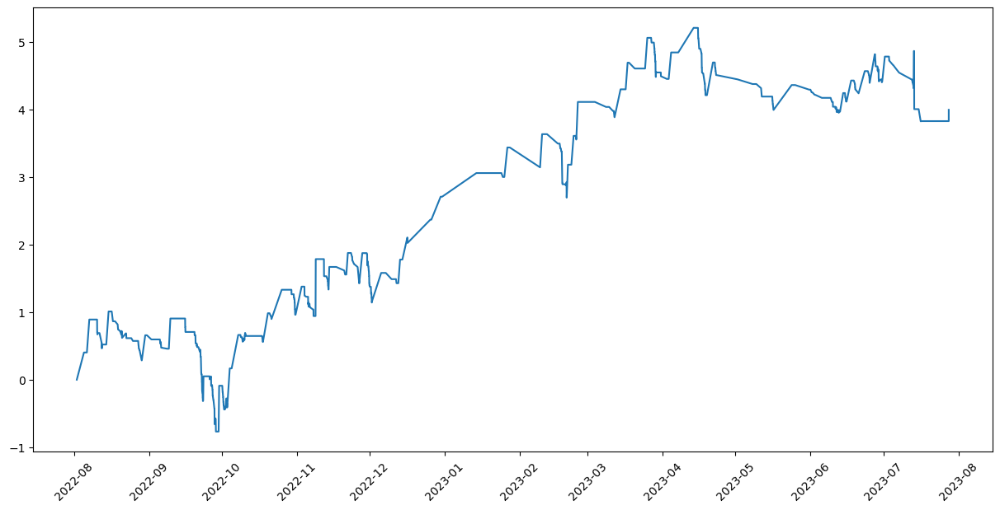

Profit/Loss: 3.9982
Maximum Drawdown: -0.7678
Maximum Holding Period: 14 days 03:00:00


In [18]:
txn = trade(P1, P2, merged_df)
train_results = showResults(txn)

In [19]:
# Create subplots
fig = make_subplots(rows=1, cols=1, shared_xaxes=True)

# Plot the ratios and buy and sell signals from z score
fig.add_trace(go.Scatter(x=ratios.index, y=ratios, name='Ratio'))

buy = ratios.copy()
sell = ratios.copy()

buy = train_results[train_results['action1'] == "Buy"]
sell = train_results[train_results['action1'] == "Sell"]
close = train_results[train_results['action1'] == "Close"]


fig.add_trace(go.Scatter(x=buy.index, y=buy['hedgeratio'], mode='markers', name='Buy Signal', marker=dict(color='green', symbol='triangle-up', size=10)), row=1, col=1)
fig.add_trace(go.Scatter(x=sell.index, y=sell['hedgeratio'], mode='markers', name='Sell Signal', marker=dict(color='red', symbol='triangle-down', size=10)), row=1, col=1)
fig.add_trace(go.Scatter(x=close.index, y=close['hedgeratio'], mode='markers', name='Close', marker=dict(color='orange', symbol='diamond', size=10)), row=1, col=1)


# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb'], name='Upper Bollinger', line=dict(color='orange')))
# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb'], name='Lower Bollinger', line=dict(color='orange')))

# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_conf'], name='Upper Bollinger', line=dict(color='green')))
# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_conf'], name='Lower Bollinger', line=dict(color='green')))

fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_stop'], name='Upper Bollinger', line=dict(color='black')), row=1, col=1)
fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_stop'], name='Lower Bollinger', line=dict(color='black')), row=1, col=1)

# fig.add_trace(go.Bar(x=selected_rows.index, y=selected_rows[P1+'_volume'], name='Bar Chart'), row=2, col=1)
# fig.add_trace(go.Bar(x=selected_rows.index, y=selected_rows[P2+'_volume'], name='Bar Chart'), row=2, col=1)

fig.update_layout(
    title='Plot Title',
    yaxis_title='Ratio',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
)

fig.show()

# HBAR/ALGO

In [20]:
P1 = 'HBAR'
P2 = 'ALGO'

price1 = selected_rows[P1+'_close']
price2 = selected_rows[P2+'_close']

selected_rows_pair = selected_rows[[P1+'_close', P2+'_close']]

ratios = price1/price2


bol_df = pd.DataFrame()

bol_df['ewma'] = ewma(ratios, '1D')
bol_df['upper_bb'], bol_df['lower_bb'] = bb(ratios, bol_df['ewma'], 1.5, '1D')
bol_df['upper_bb_conf'], bol_df['lower_bb_conf'] = bb(ratios, bol_df['ewma'], 2.5, '1D')
bol_df['upper_bb_stop'], bol_df['lower_bb_stop'] = bb(ratios, bol_df['ewma'], 3.5, '1D')

bol_df = bol_df.dropna()
bol_df

,ewma,upper_bb,lower_bb,upper_bb_conf,lower_bb_conf,upper_bb_stop,lower_bb_stop
timestamp,,,,,,,
2022-07-28 09:00:00,0.211299,0.211487,0.211110,0.211612,0.210985,0.211738,0.210859
2022-07-28 10:00:00,0.211283,0.211892,0.210673,0.212299,0.210266,0.212706,0.209860
2022-07-28 11:00:00,0.211301,0.212324,0.210278,0.213007,0.209595,0.213689,0.208913
2022-07-28 12:00:00,0.211330,0.212620,0.210039,0.213480,0.209179,0.214341,0.208318
2022-07-28 13:00:00,0.211359,0.212720,0.209998,0.213627,0.209090,0.214534,0.208183
...,...,...,...,...,...,...,...
2023-07-28 03:00:00,0.472359,0.475352,0.469366,0.477348,0.467370,0.479344,0.465374
2023-07-28 04:00:00,0.472345,0.475336,0.469353,0.477330,0.467359,0.479325,0.465365
2023-07-28 05:00:00,0.472306,0.475290,0.469323,0.477278,0.467334,0.479267,0.465345


In [21]:
merged_df = pd.merge(selected_rows_pair, bol_df, left_index=True, right_index=True)

merged_df

,HBAR_close,ALGO_close,ewma,upper_bb,lower_bb,upper_bb_conf,lower_bb_conf,upper_bb_stop,lower_bb_stop
timestamp,,,,,,,,,
2022-07-28 09:00:00,0.0687,0.3254,0.211299,0.211487,0.211110,0.211612,0.210985,0.211738,0.210859
2022-07-28 10:00:00,0.0688,0.3268,0.211283,0.211892,0.210673,0.212299,0.210266,0.212706,0.209860
2022-07-28 11:00:00,0.0697,0.3285,0.211301,0.212324,0.210278,0.213007,0.209595,0.213689,0.208913
2022-07-28 12:00:00,0.0691,0.3249,0.211330,0.212620,0.210039,0.213480,0.209179,0.214341,0.208318
2022-07-28 13:00:00,0.0688,0.3234,0.211359,0.212720,0.209998,0.213627,0.209090,0.214534,0.208183
...,...,...,...,...,...,...,...,...,...
2023-07-28 03:00:00,0.0517,0.1092,0.472359,0.475352,0.469366,0.477348,0.467370,0.479344,0.465374
2023-07-28 04:00:00,0.0516,0.1094,0.472345,0.475336,0.469353,0.477330,0.467359,0.479325,0.465365
2023-07-28 05:00:00,0.0510,0.1084,0.472306,0.475290,0.469323,0.477278,0.467334,0.479267,0.465345


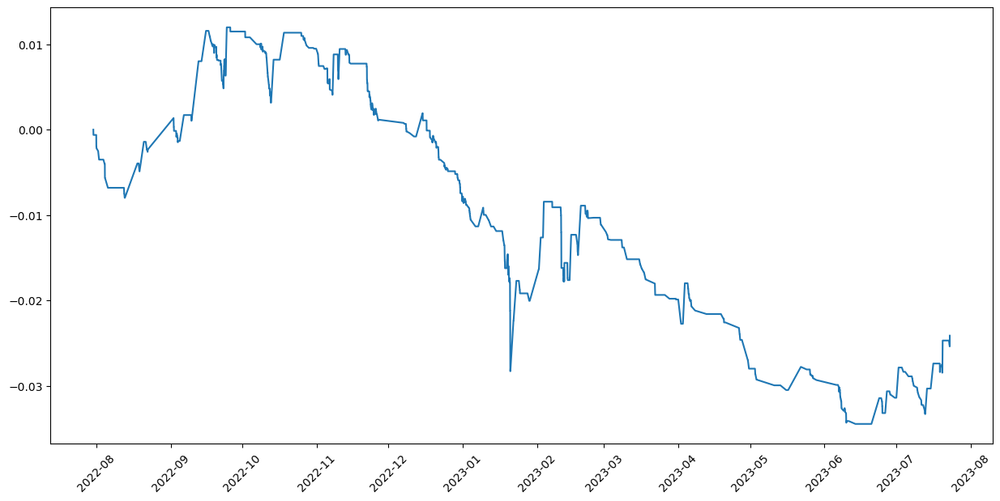

Profit/Loss: -0.0241
Maximum Drawdown: -0.0345
Maximum Holding Period: 10 days 16:00:00


In [22]:
txn = trade(P1, P2, merged_df)
train_results = showResults(txn)

In [23]:
# Create subplots
fig = make_subplots(rows=1, cols=1)

# Plot the ratios and buy and sell signals from z score
fig.add_trace(go.Scatter(x=ratios.index, y=ratios, name='Ratio'))

buy = ratios.copy()
sell = ratios.copy()

buy = train_results[train_results['action1'] == "Buy"]
sell = train_results[train_results['action1'] == "Sell"]
close = train_results[train_results['action1'] == "Close"]


fig.add_trace(go.Scatter(x=buy.index, y=buy['hedgeratio'], mode='markers', name='Buy Signal', marker=dict(color='green', symbol='triangle-up', size=10)))
fig.add_trace(go.Scatter(x=sell.index, y=sell['hedgeratio'], mode='markers', name='Sell Signal', marker=dict(color='red', symbol='triangle-down', size=10)))
fig.add_trace(go.Scatter(x=close.index, y=close['hedgeratio'], mode='markers', name='Close', marker=dict(color='orange', symbol='diamond', size=10)))


# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb'], name='Upper Bollinger', line=dict(color='orange')))
# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb'], name='Lower Bollinger', line=dict(color='orange')))

# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_conf'], name='Upper Bollinger', line=dict(color='green')))
# fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_conf'], name='Lower Bollinger', line=dict(color='green')))

fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_stop'], name='Upper Bollinger', line=dict(color='black')))
fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_stop'], name='Lower Bollinger', line=dict(color='black')))

fig.update_layout(
    title='Plot Title',
    xaxis_title='Date Time',
    yaxis_title='Ratio',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
)

fig.show()

# Ratio (daily) and the regimes

In [24]:
import statsmodels.api as sm

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Markov Switching Model Results                        
==============================================================================
Dep. Variable:                      y   No. Observations:                  365
Model:               MarkovRegression   Log Likelihood                 774.405
Date:                Fri, 28 Jul 2023   AIC                          -1530.810
Time:                        15:34:44   BIC                          -1495.711
Sample:                    07-29-2022   HQIC                         -1516.862
                         - 07-28-2023                                         
Covariance Type:               approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.765e-06   4.22e-06      1.129      0.259   -3.51e-06     1.3e-05
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0005      0.000      4.488      0.000       0.000       0.001
                             Regime 2 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0028      0.001      4.675      0.000       0.002       0.004
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.4013      0.203      1.978      0.048       0.004       0.799
p[1->0]        0.0622      0.034      1.851      0.064      -0.004       0.128
p[2->0]     2.675e-06      0.155   1.73e-05      1.000      -0.304       0.304
p[0->1]        0.5740      0.243      2.362      0.018       0.098       1.050
p[1->1]        0.8680      0.046     18.817      0.000       0.778       0.958
p[2->1]        0.1714      0.120      1.426      0.154      -0.064       0.407
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

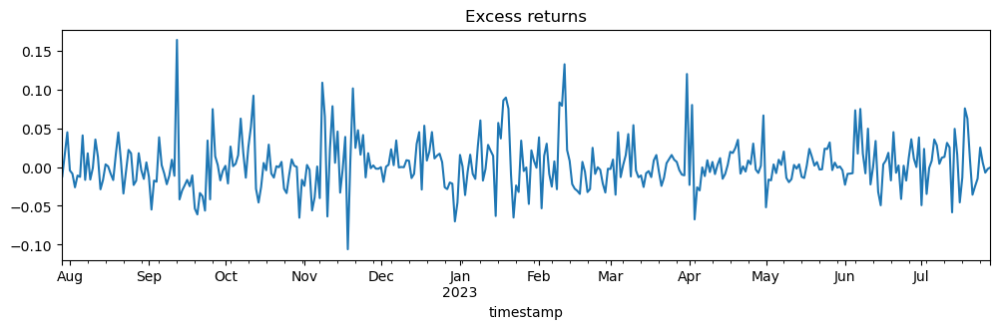

In [25]:
nifty_ret = ratios.resample('D').last().pct_change().dropna() 
nifty_ret.plot(title='Excess returns', figsize=(12, 3))

mod_kns = sm.tsa.MarkovRegression(nifty_ret.dropna(), k_regimes=3, trend='nc', switching_variance=True)
res_kns = mod_kns.fit()
res_kns.summary()

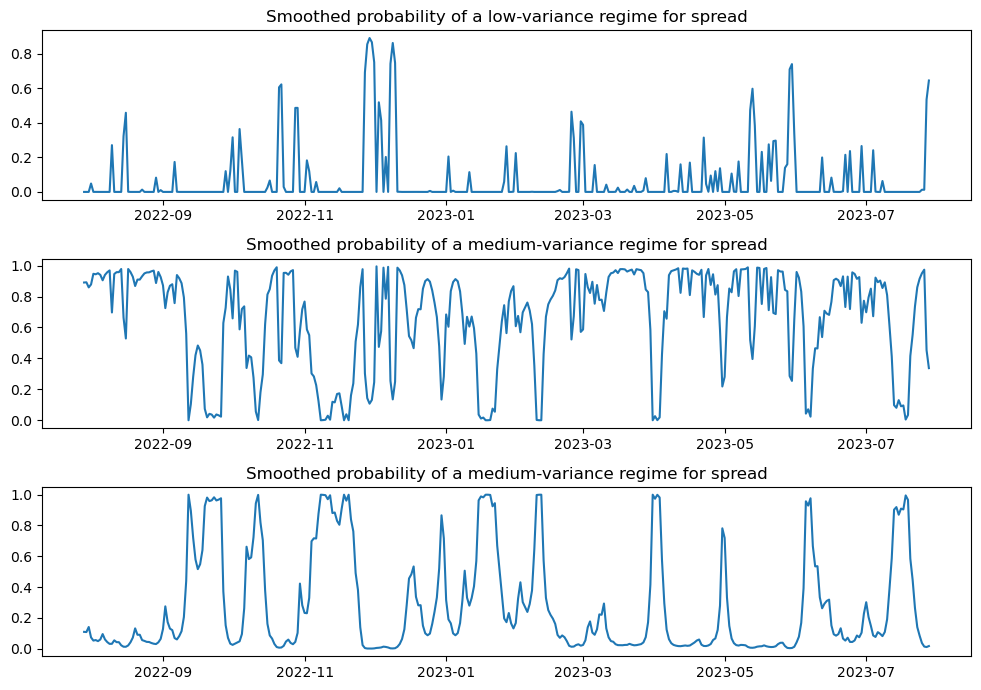

In [26]:
fig, axes = plt.subplots(3, figsize=(10,7))
ax = axes[0]
ax.plot(res_kns.smoothed_marginal_probabilities[0])
ax.set(title='Smoothed probability of a low-variance regime for spread')
ax = axes[1]
ax.plot(res_kns.smoothed_marginal_probabilities[1])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
ax = axes[2]
ax.plot(res_kns.smoothed_marginal_probabilities[2])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
fig.tight_layout()

# Single price path, returns (weekly) and the regimes

In [27]:
selected_rows['HBAR_close']

timestamp
2022-07-28 08:00:00    0.0688
2022-07-28 09:00:00    0.0687
2022-07-28 10:00:00    0.0688
2022-07-28 11:00:00    0.0697
2022-07-28 12:00:00    0.0691
                        ...  
2023-07-28 03:00:00    0.0517
2023-07-28 04:00:00    0.0516
2023-07-28 05:00:00    0.0510
2023-07-28 06:00:00    0.0513
2023-07-28 07:00:00    0.0513
Name: HBAR_close, Length: 8759, dtype: float64

<Axes: title={'center': 'Excess returns'}, xlabel='timestamp'>

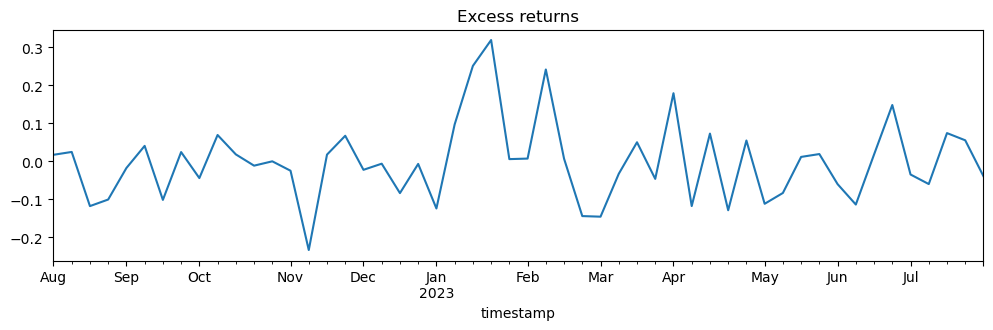

In [28]:
nifty_ret = selected_rows['HBAR_close'].resample('W').last().pct_change().dropna() 
nifty_ret.plot(title='Excess returns', figsize=(12, 3))

In [29]:
mod_kns = sm.tsa.MarkovRegression(nifty_ret.dropna(), k_regimes=3, trend='nc', switching_variance=True)
res_kns = mod_kns.fit()
res_kns.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Markov Switching Model Results                        
==============================================================================
Dep. Variable:             HBAR_close   No. Observations:                   52
Model:               MarkovRegression   Log Likelihood                  50.544
Date:                Fri, 28 Jul 2023   AIC                            -83.087
Time:                        15:34:46   BIC                            -65.526
Sample:                    08-07-2022   HQIC                           -76.355
                         - 07-30-2023                                         
Covariance Type:               approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0002      0.000      1.551      0.121   -4.51e-05       0.000
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0065      0.002      3.881      0.000       0.003       0.010
                             Regime 2 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0309      0.014      2.150      0.032       0.003       0.059
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.3098      0.214      1.446      0.148      -0.110       0.729
p[1->0]        0.0303        nan        nan        nan         nan         nan
p[2->0]        0.3926      0.192      2.043      0.041       0.016       0.769
p[0->1]     3.556e-28        nan        nan        nan         nan         nan
p[1->1]        0.9697        nan        nan        nan         nan         nan
p[2->1]        0.1286      0.105      1.223      0.221      -0.077       0.335
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

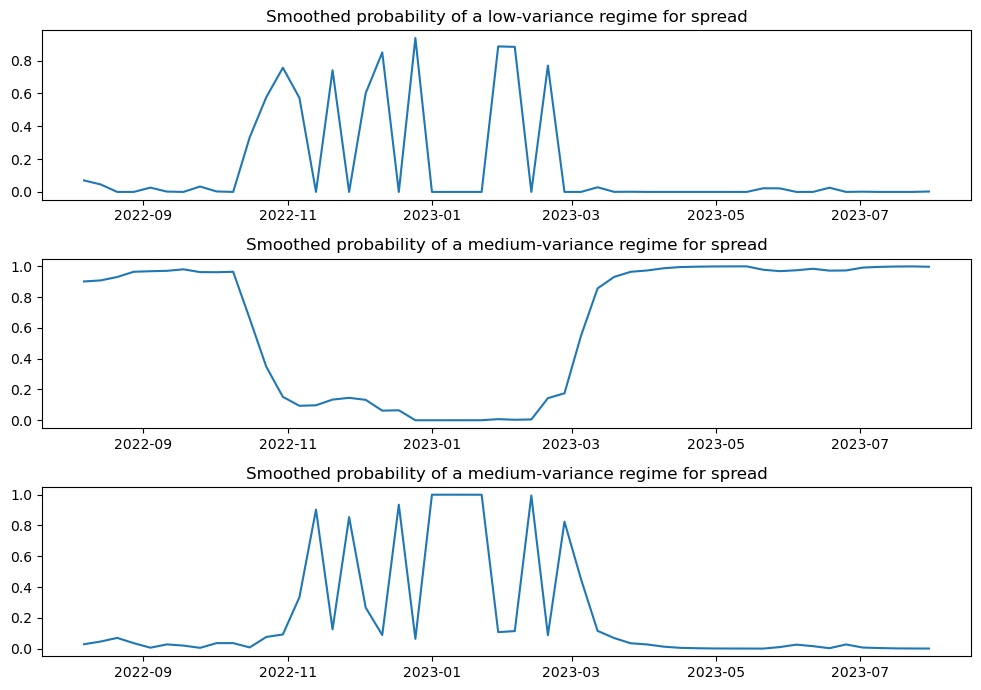

In [30]:
fig, axes = plt.subplots(3, figsize=(10,7))
ax = axes[0]
ax.plot(res_kns.smoothed_marginal_probabilities[0])
ax.set(title='Smoothed probability of a low-variance regime for spread')
ax = axes[1]
ax.plot(res_kns.smoothed_marginal_probabilities[1])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
ax = axes[2]
ax.plot(res_kns.smoothed_marginal_probabilities[2])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
fig.tight_layout()

In [31]:
res_kns.smoothed_marginal_probabilities[1]

timestamp
2022-08-07    0.901704
2022-08-14    0.908519
2022-08-21    0.930669
2022-08-28    0.964704
2022-09-04    0.968089
2022-09-11    0.970758
2022-09-18    0.980498
2022-09-25    0.962462
2022-10-02    0.961827
2022-10-09    0.964515
2022-10-16    0.659410
2022-10-23    0.347452
2022-10-30    0.152095
2022-11-06    0.094024
2022-11-13    0.097370
2022-11-20    0.134299
2022-11-27    0.145759
2022-12-04    0.132669
2022-12-11    0.062578
2022-12-18    0.064947
2022-12-25    0.000135
2023-01-01    0.000139
2023-01-08    0.000173
2023-01-15    0.000187
2023-01-22    0.000331
2023-01-29    0.007223
2023-02-05    0.003256
2023-02-12    0.005328
2023-02-19    0.143641
2023-02-26    0.175123
2023-03-05    0.549208
2023-03-12    0.856743
2023-03-19    0.931220
2023-03-26    0.964417
2023-04-02    0.973120
2023-04-09    0.987627
2023-04-16    0.995271
2023-04-23    0.997665
2023-04-30    0.999144
2023-05-07    0.999548
2023-05-14    0.999748
2023-05-21    0.977755
2023-05-28    0.968581
2

# Abs spread and the regimes

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Markov Switching Model Results                        
==============================================================================
Dep. Variable:                      y   No. Observations:                  365
Model:               MarkovRegression   Log Likelihood                 617.329
Date:                Fri, 28 Jul 2023   AIC                          -1216.658
Time:                        15:34:52   BIC                          -1181.559
Sample:                    07-29-2022   HQIC                         -1202.710
                         - 07-28-2023                                         
Covariance Type:               approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0035      0.001      5.264      0.000       0.002       0.005
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0008      0.000      6.446      0.000       0.001       0.001
                             Regime 2 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0149      0.007      2.057      0.040       0.001       0.029
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.8832      0.000   7939.560      0.000       0.883       0.883
p[1->0]        0.0584      0.031      1.861      0.063      -0.003       0.120
p[2->0]        0.2105      0.164      1.286      0.198      -0.110       0.531
p[0->1]        0.1168   4.05e-05   2887.348      0.000       0.117       0.117
p[1->1]        0.9244      0.028     32.460      0.000       0.869       0.980
p[2->1]     5.038e-45        nan        nan        nan         nan         nan
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

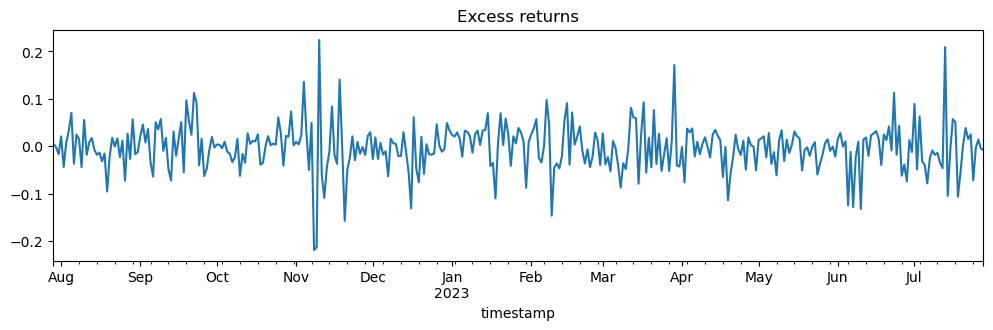

In [32]:
abs_spread = abs(selected_rows['HBAR_close'] - selected_rows['ALGO_close'])
nifty_ret = abs_spread.resample('D').last().pct_change().dropna() 
nifty_ret.plot(title='Excess returns', figsize=(12, 3))
mod_kns = sm.tsa.MarkovRegression(nifty_ret.dropna(), k_regimes=3, trend='nc', switching_variance=True)
res_kns = mod_kns.fit()
res_kns.summary()

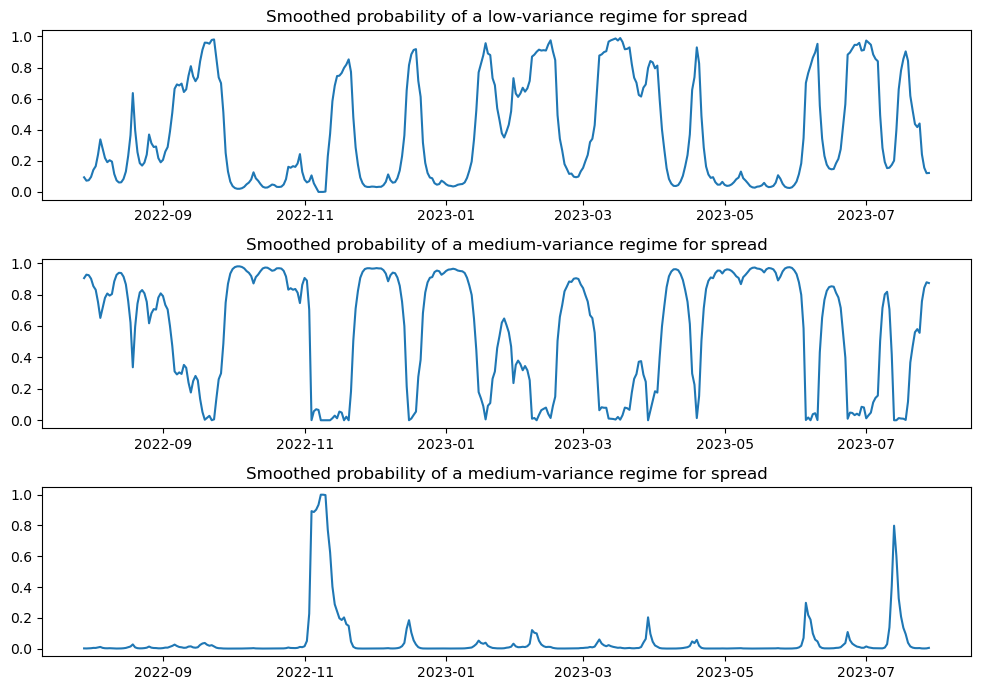

In [33]:
fig, axes = plt.subplots(3, figsize=(10,7))
ax = axes[0]
ax.plot(res_kns.smoothed_marginal_probabilities[0])
ax.set(title='Smoothed probability of a low-variance regime for spread')
ax = axes[1]
ax.plot(res_kns.smoothed_marginal_probabilities[1])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
ax = axes[2]
ax.plot(res_kns.smoothed_marginal_probabilities[2])
ax.set(title='Smoothed probability of a medium-variance regime for spread')
fig.tight_layout()

In [85]:
# Trade using a simple strategy WITH INVENTORY
def trade(P1, P2, merged_df, low_var, med_var, high_var):
    
    price1 = merged_df[P1+'_close']
    price2 = merged_df[P2+'_close']
    
    ratios = price1/price2
    
    # Start with no money and no positions
    money = 0
    countS1 = 0
    countS2 = 0
    drawdown = 0
    
    # Logging all transactions for validation
    transactions = []
    
    def logTxn(datetime, action1, coin1, price1, qty1,
               action2, coin2, price2, qty2, hedgeratio, pnl, drawdown=0, holdingperiod=timedelta(0)):
        
        txn = {}
        txn['datetime'] = datetime
        txn['action1'] = action1
        txn['coin1'] = coin1
        txn['price1'] = price1
        txn['qty1'] = qty1
        txn['action2'] = action2
        txn['coin2'] = coin2
        txn['price2'] = price2
        txn['qty2'] = qty2
        txn['hedgeratio'] = hedgeratio
        txn['pnl'] = pnl
        txn['drawdown'] = drawdown
        txn['holdingperiod'] = holdingperiod
        
        return txn
    
    # Simulate trading
    # Period by period
    # Trade on trading signals derived based on information only available at the point in time
    
    trades = 0
    last_traded_bb_upper = 0
    last_traded_bb_lower = 0
    variance_regime = ''
    rounded_dt_ratios = ratios.index.ceil('D')
    
    for i in range(len(ratios)):
        
        date_time_index = rounded_dt_ratios[i]
        
        if low_var[date_time_index] > 0.50:
            variance_regime = 'low'
#             print('low')
        if high_var[date_time_index] > 0.50:
            variance_regime = 'high'
#             print('medium')
            
            
        # low var 
        if variance_regime == 'low':
            
            # Sell short if the first upper bol is hit
            if ((ratios[i] > merged_df['upper_bb'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_upper = merged_df['upper_bb'].iloc[i]
                money += price1[i] - price2[i] * ratios[i]
                countS1 -= 1
                countS2 += ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Sell', P1, price1[i], countS1,
                           'Buy', P2, price2[i], countS2, 
                            ratios[i], money)
                )


            # Buy long if the first lower bb hit
            elif ((ratios[i] < merged_df['lower_bb'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_lower = merged_df['lower_bb'].iloc[i]
                money -= price1[i] - price2[i] * ratios[i]
                countS1 += 1
                countS2 -= ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Buy', P1, price1[i], countS1,
                           'Sell', P2, price2[i], countS2, 
                           ratios[i], money)
                )

    #             lower_sig = 0
    #             print("long")

            # stop out or take profit at % of upper band

            elif (last_traded_bb_upper != 0) and ((ratios[i] >= last_traded_bb_upper *1.05) or (ratios[i] <= last_traded_bb_upper * 0.95)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_upper = 0

            elif (last_traded_bb_lower != 0) and ((ratios[i] <= last_traded_bb_lower *0.95) or (ratios[i] >= last_traded_bb_lower * 1.05)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_lower = 0
        
      
            
            # Keeps track of maximum drawdown when there are existing positions
            else:            
                drawdown = min(price1[i] * countS1 + price2[i] * countS2, drawdown)
            
            
        # medium var
        elif variance_regime == 'medium':
            
            # Sell short if the first upper bol is hit
            if ((ratios[i] > merged_df['upper_bb_conf'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_upper = merged_df['upper_bb_conf'].iloc[i]
                money += price1[i] - price2[i] * ratios[i]
                countS1 -= 1
                countS2 += ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Sell', P1, price1[i], countS1,
                           'Buy', P2, price2[i], countS2, 
                            ratios[i], money)
                )


            # Buy long if the first lower bb hit
            elif ((ratios[i] < merged_df['lower_bb_conf'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_lower = merged_df['lower_bb_conf'].iloc[i]
                money -= price1[i] - price2[i] * ratios[i]
                countS1 += 1
                countS2 -= ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Buy', P1, price1[i], countS1,
                           'Sell', P2, price2[i], countS2, 
                           ratios[i], money)
                )

    #             lower_sig = 0
    #             print("long")

            # stop out or take profit at % of upper band

            elif (last_traded_bb_upper != 0) and ((ratios[i] >= last_traded_bb_upper *1.05) or (ratios[i] <= last_traded_bb_upper * 0.95)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_upper = 0

            elif (last_traded_bb_lower != 0) and ((ratios[i] <= last_traded_bb_lower *0.95) or (ratios[i] >= last_traded_bb_lower * 1.05)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_lower = 0
        
      
            
            # Keeps track of maximum drawdown when there are existing positions
            else:            
                drawdown = min(price1[i] * countS1 + price2[i] * countS2, drawdown)
        
        # high var
        elif variance_regime == 'high':
            
            # Sell short if the first upper bol is hit
            if ((ratios[i] > merged_df['upper_bb_stop'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_upper = merged_df['upper_bb_stop'].iloc[i]
                money += price1[i] - price2[i] * ratios[i]
                countS1 -= 1
                countS2 += ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Sell', P1, price1[i], countS1,
                           'Buy', P2, price2[i], countS2, 
                            ratios[i], money)
                )


            # Buy long if the first lower bb hit
            elif ((ratios[i] < merged_df['lower_bb_stop'].iloc[i]) & (countS1 == 0) & (countS2 == 0)):
                last_traded_bb_lower = merged_df['lower_bb_stop'].iloc[i]
                money -= price1[i] - price2[i] * ratios[i]
                countS1 += 1
                countS2 -= ratios[i]

                opendatetime = ratios.index[i]

                transactions.append(
                    logTxn(opendatetime, 
                           'Buy', P1, price1[i], countS1,
                           'Sell', P2, price2[i], countS2, 
                           ratios[i], money)
                )

    #             lower_sig = 0
    #             print("long")

            # stop out or take profit at % of upper band

            elif (last_traded_bb_upper != 0) and ((ratios[i] >= last_traded_bb_upper *1.05) or (ratios[i] <= last_traded_bb_upper * 0.95)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_upper = 0

            elif (last_traded_bb_lower != 0) and ((ratios[i] <= last_traded_bb_lower *0.95) or (ratios[i] >= last_traded_bb_lower * 1.05)) and (countS1 != 0) and (countS2 != 0):
                money += price1[i] * countS1 + price2[i] * countS2

                closedatetime = ratios.index[i]
                holdingperiod = closedatetime - opendatetime

                transactions.append(
                    logTxn(closedatetime, 
                           'Close', P1, price1[i], countS1,
                           'Close', P2, price2[i], countS2, 
                           ratios[i], money, min(money, drawdown), holdingperiod)
                )

                countS1 = 0
                countS2 = 0
                drawdown = 0
                last_traded_bb_lower = 0
        
      
            
            # Keeps track of maximum drawdown when there are existing positions
            else:            
                drawdown = min(price1[i] * countS1 + price2[i] * countS2, drawdown)
            
            
        
        
            
    if countS1 != 0 or countS2 != 0:
        money = money + price1[-1] * countS1 + price2[-1] * countS2
        transactions.append(
        logTxn(opendatetime, 
                       'End', P1, price1[i], countS1,
                       'End', P2, price2[i], countS2, 
                       ratios[i], money)
        )
    
    return transactions

In [73]:
low_var = res_kns.smoothed_marginal_probabilities[0]
med_var = res_kns.smoothed_marginal_probabilities[1]
high_var = res_kns.smoothed_marginal_probabilities[2]



# for i in range(len(low_var)):
#     if low_var.iloc[i] > 0.50:
#         print('low variance')
#     if med_var.iloc[i] > 0.50:
#         print('medium variance')
#     if high_var.iloc[i] > 0.50:
#         print('high variance') 
        
#     print('========================')
    
    

In [74]:
# Get the last timestamp in the datetime index
last_timestamp = low_var.index[-1]
# Calculate the timestamp one day later
new_timestamp = last_timestamp + pd.Timedelta(days=1)
# Copy the last value
last_value = low_var.iloc[-1]
low_var[new_timestamp] = last_value

low_var

timestamp
2022-07-29    0.093956
2022-07-30    0.072410
2022-07-31    0.075105
2022-08-01    0.096392
2022-08-02    0.141820
                ...   
2023-07-25    0.241513
2023-07-26    0.155736
2023-07-27    0.120428
2023-07-28    0.121883
2023-07-29    0.121883
Freq: D, Name: 0, Length: 366, dtype: float64

In [75]:
# Get the last timestamp in the datetime index
last_timestamp = med_var.index[-1]
# Calculate the timestamp one day later
new_timestamp = last_timestamp + pd.Timedelta(days=1)
# Copy the last value
last_value = med_var.iloc[-1]
med_var[new_timestamp] = last_value
med_var

timestamp
2022-07-29    0.904732
2022-07-30    0.926624
2022-07-31    0.923467
2022-08-01    0.901071
2022-08-02    0.853561
                ...   
2023-07-25    0.757290
2023-07-26    0.843379
2023-07-27    0.878029
2023-07-28    0.873329
2023-07-29    0.873329
Freq: D, Name: 1, Length: 366, dtype: float64

In [76]:
# Get the last timestamp in the datetime index
last_timestamp = high_var.index[-1]
# Calculate the timestamp one day later
new_timestamp = last_timestamp + pd.Timedelta(days=1)
# Copy the last value
last_value = high_var.iloc[-1]
high_var[new_timestamp] = last_value
high_var

timestamp
2022-07-29    0.001313
2022-07-30    0.000966
2022-07-31    0.001428
2022-08-01    0.002537
2022-08-02    0.004619
                ...   
2023-07-25    0.001197
2023-07-26    0.000885
2023-07-27    0.001543
2023-07-28    0.004788
2023-07-29    0.004788
Freq: D, Name: 2, Length: 366, dtype: float64

In [63]:
merged_df

,HBAR_close,ALGO_close,ewma,upper_bb,lower_bb,upper_bb_conf,lower_bb_conf,upper_bb_stop,lower_bb_stop
timestamp,,,,,,,,,
2022-07-28 09:00:00,0.0687,0.3254,0.211299,0.211487,0.211110,0.211612,0.210985,0.211738,0.210859
2022-07-28 10:00:00,0.0688,0.3268,0.211283,0.211892,0.210673,0.212299,0.210266,0.212706,0.209860
2022-07-28 11:00:00,0.0697,0.3285,0.211301,0.212324,0.210278,0.213007,0.209595,0.213689,0.208913
2022-07-28 12:00:00,0.0691,0.3249,0.211330,0.212620,0.210039,0.213480,0.209179,0.214341,0.208318
2022-07-28 13:00:00,0.0688,0.3234,0.211359,0.212720,0.209998,0.213627,0.209090,0.214534,0.208183
...,...,...,...,...,...,...,...,...,...
2023-07-28 03:00:00,0.0517,0.1092,0.472359,0.475352,0.469366,0.477348,0.467370,0.479344,0.465374
2023-07-28 04:00:00,0.0516,0.1094,0.472345,0.475336,0.469353,0.477330,0.467359,0.479325,0.465365
2023-07-28 05:00:00,0.0510,0.1084,0.472306,0.475290,0.469323,0.477278,0.467334,0.479267,0.465345


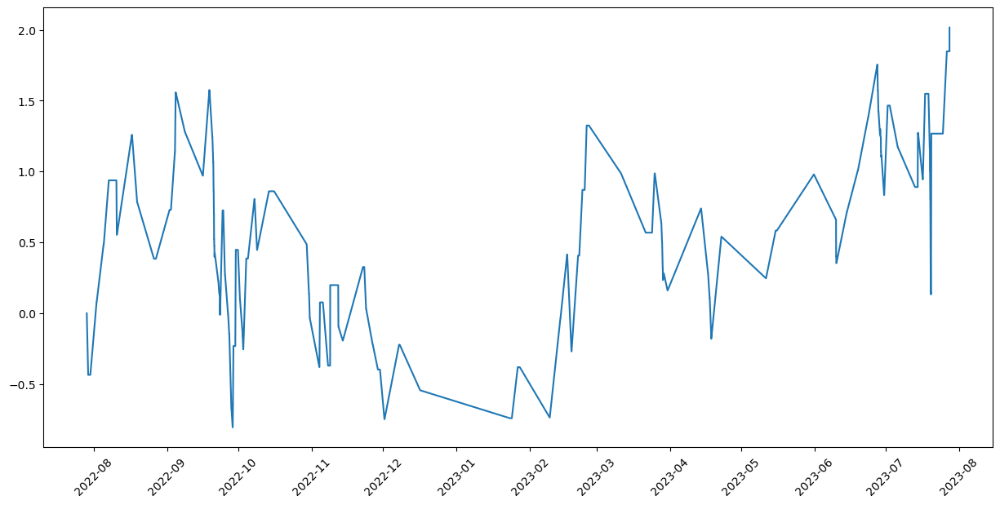

Profit/Loss: 2.0157
Maximum Drawdown: -0.8042
Maximum Holding Period: 37 days 21:00:00


In [88]:
txn = trade(P1, P2, merged_df,low_var, med_var, high_var)
train_results = showResults(txn)

# x-min(x)/ (max(x)-min(x))

In [89]:
# Create subplots
fig = make_subplots(rows=1, cols=1, shared_xaxes=True)

# Plot the ratios and buy and sell signals from z score
fig.add_trace(go.Scatter(x=ratios.index, y=ratios, name='Ratio'))

buy = ratios.copy()
sell = ratios.copy()

buy = train_results[train_results['action1'] == "Buy"]
sell = train_results[train_results['action1'] == "Sell"]
close = train_results[train_results['action1'] == "Close"]


fig.add_trace(go.Scatter(x=buy.index, y=buy['hedgeratio'], mode='markers', name='Buy Signal', marker=dict(color='green', symbol='triangle-up', size=10)), row=1, col=1)
fig.add_trace(go.Scatter(x=sell.index, y=sell['hedgeratio'], mode='markers', name='Sell Signal', marker=dict(color='red', symbol='triangle-down', size=10)), row=1, col=1)
fig.add_trace(go.Scatter(x=close.index, y=close['hedgeratio'], mode='markers', name='Close', marker=dict(color='orange', symbol='diamond', size=10)), row=1, col=1)


fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb'], name='Upper Bollinger', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb'], name='Lower Bollinger', line=dict(color='orange')))

fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_conf'], name='Upper Bollinger', line=dict(color='green')))
fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_conf'], name='Lower Bollinger', line=dict(color='green')))

fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['upper_bb_stop'], name='Upper Bollinger', line=dict(color='black')), row=1, col=1)
fig.add_trace(go.Scatter(x=bol_df.index, y=bol_df['lower_bb_stop'], name='Lower Bollinger', line=dict(color='black')), row=1, col=1)

# fig.add_trace(go.Bar(x=selected_rows.index, y=selected_rows[P1+'_volume'], name='Bar Chart'), row=2, col=1)
# fig.add_trace(go.Bar(x=selected_rows.index, y=selected_rows[P2+'_volume'], name='Bar Chart'), row=2, col=1)

fig.update_layout(
    title='Plot Title',
    yaxis_title='Ratio',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
)

fig.show()

In [91]:
train_results

,action1,coin1,price1,qty1,action2,coin2,price2,qty2,hedgeratio,pnl,drawdown,holdingperiod
datetime,,,,,,,,,,,,
2022-07-29 00:00:00,Sell,LINK,7.501,-1,Buy,XLM,0.1180,63.567797,63.567797,0.000000,0.000000,0 days 00:00:00
2022-07-29 14:00:00,Close,LINK,7.897,-1,Close,XLM,0.1174,63.567797,67.265758,-0.434141,-0.434141,0 days 14:00:00
2022-07-30 12:00:00,Sell,LINK,7.937,-1,Buy,XLM,0.1193,66.529757,66.529757,-0.434141,0.000000,0 days 00:00:00
2022-08-02 03:00:00,Close,LINK,7.118,-1,Close,XLM,0.1147,66.529757,62.057541,0.078822,-0.039694,2 days 15:00:00
2022-08-02 04:00:00,Buy,LINK,7.102,1,Sell,XLM,0.1145,-62.026201,62.026201,0.078822,0.000000,0 days 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-20 08:00:00,Close,LINK,7.665,1,Close,XLM,0.1649,-39.605411,46.482717,1.267613,0.000000,0 days 03:00:00
2023-07-25 05:00:00,Sell,LINK,7.603,-1,Buy,XLM,0.1428,53.242297,53.242297,1.267613,0.000000,0 days 00:00:00
2023-07-26 21:00:00,Close,LINK,7.736,-1,Close,XLM,0.1562,53.242297,49.526248,1.848060,-0.039133,1 days 16:00:00


In [94]:
# win rate

win_count = 0
loss_count = 0


for i in range(1, len(train_results)):
    prev_value = train_results['pnl'].iloc[i - 1]
    current_value = train_results['pnl'].iloc[i]
    
    if current_value > prev_value:
        win_count += 1
    elif current_value < prev_value:
        loss_count += 1
        
print('wins:', win_count, 'loss:', loss_count)

wins: 53 loss: 84


In [82]:
# regimes with original distribution (trade in certain regimes and dont trade in others)

In [95]:
import json

with open('dist.json') as json_file:
    dist_dict = json.load(json_file)
    
dist_dict

{"('XLM', 'LINK')": {'distribution': 'dweibull',
  'params': [1.1925562872896802, 0.013965646439603081, 0.0015677625637468963]},
 "('XLM', 'AAVE')": {'distribution': 't',
  'params': [1.5863449198086441,
   0.001245372999809053,
   0.00015670724210678863]},
 "('MKR', 'EOS')": {'distribution': 'dweibull',
  'params': [1.154372237489214, 690.751568258228, 139.1738523736201]},
 "('BCH', 'MKR')": {'distribution': 'genextreme',
  'params': [-0.06643778417936935, 0.16737976326279597, 0.038246583362280706]},
 "('AAVE', 'EOS')": {'distribution': 't',
  'params': [9.382589538434985, 71.30505107875848, 13.640660971319189]},
 "('HBAR', 'ALGO')": {'distribution': 'dweibull',
  'params': [1.0464948673758383, 0.22447970543023815, 0.047701692812717286]},
 "('BCH', 'AAVE')": {'distribution': 'genextreme',
  'params': [-0.07033958275832669, 1.6526946626785102, 0.33412352602387574]},
 "('UNI', 'EOS')": {'distribution': 'norm',
  'params': [5.289895619928916, 1.10064647916652]},
 "('BCH', 'XLM')": {'dist

In [98]:
pair_params = dist_dict[str((P2,P1))]
pair_params

{'distribution': 'dweibull',
 'params': [1.1925562872896802, 0.013965646439603081, 0.0015677625637468963]}

In [101]:
import scipy.stats as stats

def get_distribution(dist_name):
    try:
        dist = getattr(stats, dist_name)
        return dist
    except AttributeError:
        raise ValueError(f"Invalid distribution name: {dist_name}")

def thresholds(params, distribution):
    model = get_distribution(distribution)
    
    upper_thresh = model.ppf(0.90, *params)
    lower_thresh = model.ppf(0.10, *params)
    close_thresh_1 = model.ppf(0.75, *params)
    close_thresh_2 = model.ppf(0.25, *params)
    
    return [upper_thresh, lower_thresh, close_thresh_1, close_thresh_2]

In [102]:
upper_thresh, lower_thresh, close_thresh_1, close_thresh_2 = thresholds(pair_params['params'], pair_params['distribution'])
upper_thresh, lower_thresh, close_thresh_1, close_thresh_2

(0.01630224352625906,
 0.011629049352947101,
 0.015118586932974184,
 0.012812705946231979)